# TP1

Lucas Nedel Kirsten, 230262
Diego Severo, XXXXXX

In [1]:
import cvwt
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### Questão 1

In [2]:
# define iterations
J = 2

# input signal
x = np.array([-2, 1, 3, 2, -3, 4])

# filters
wavelet = 'haar'

In [3]:
# going forward in the wavelet transform
print('Wavelet:')
cA, cD = cvwt.dwt(x=x, J=J, wavelet=wavelet)

print(f'A{J}: ', cA)
for j, dj in enumerate(cD):
    print(f'D{j+1}: ', dj)

Wavelet:
A2:  [2.  0.5]
D1:  [-2.12132034  0.70710678 -4.94974747]
D2:  [-3.   0.5]


In [4]:
# returning to the original signal
print('\nInverse Wavelet:')
cA = cvwt.idwt(cA, cD)
print(f'Inverse(A{J-j}): ', cA)


Inverse Wavelet:
Inverse(A1):  [-2.  1.  3.  2. -3.  4.]


#### Questão 2

In [11]:
# define input image
x = cv2.imread('cvwt/barbara.jpg')
x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)

# define iterations
J = 2

# filters
wavelet = 'haar'

C:\Users\kirstenl\Anaconda3\envs\mestrado\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  """Entry point for launching an IPython kernel.


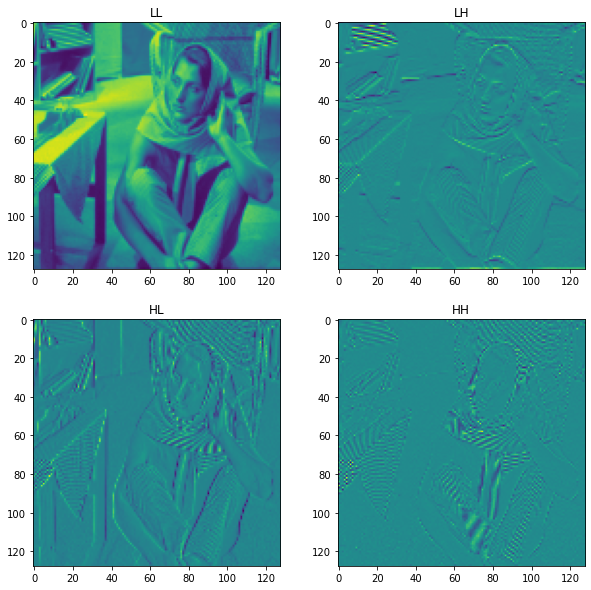

In [12]:
cA, cD = cvwt.dwt2(x, J=J, wavelet=wavelet)
cvwt.plot_dwt2(cA, cD[-1])

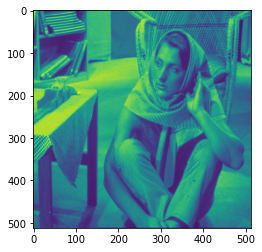

In [14]:
inv = cvwt.idwt2(cA, cD, wavelet=wavelet)
plt.imshow(inv)

#### Questão 3

TODO: use 3 channels instead of only 1 (make operations per channel)

In [33]:
# define input image
x = cv2.imread('cvwt/barbara.jpg')
x = cv2.cvtColor(x, cv2.COLOR_BGR2GRAY)

# define iterations
Js = [1,2,3]

# filters
wavelet = 'haar'

# noise parameters
mean = 0
var = 200

# parameter for soft thersholding
ts = np.linspace(0, 255, num=5, dtype='int')

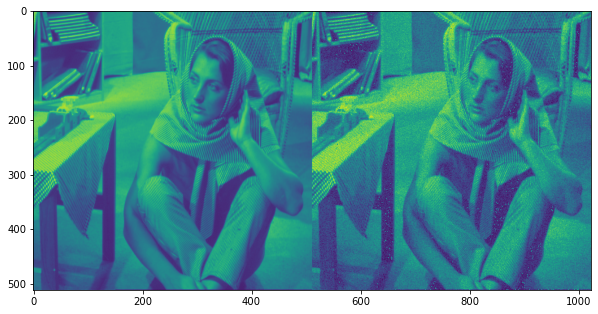

In [34]:
# add noise to the image
sigma = np.sqrt(var)
noise = x.astype('float32') + np.random.normal(mean,sigma, x.shape)
noise = np.uint8(noise)

# compare original x noise
plt.figure(figsize=(10,10))
plt.imshow(np.hstack([x, noise]))

C:\Users\kirstenl\Anaconda3\envs\mestrado\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  """


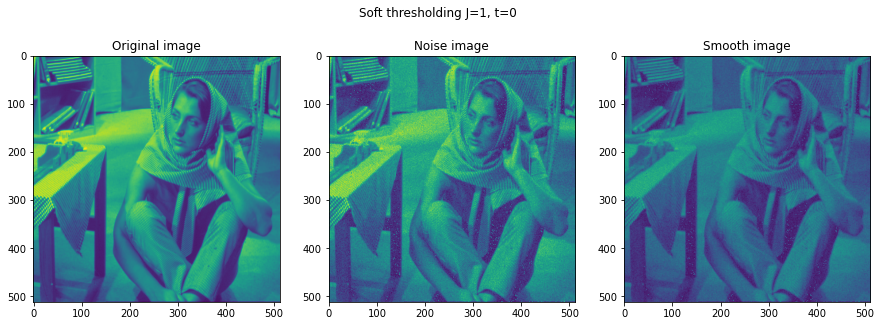

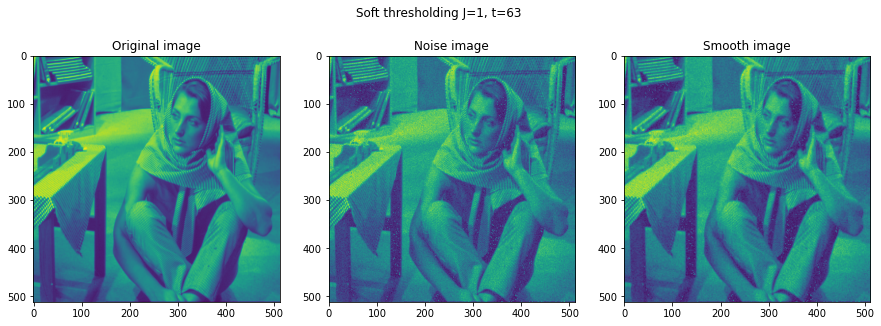

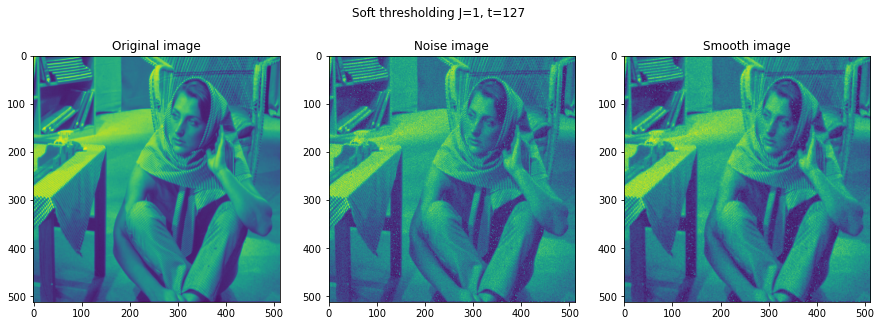

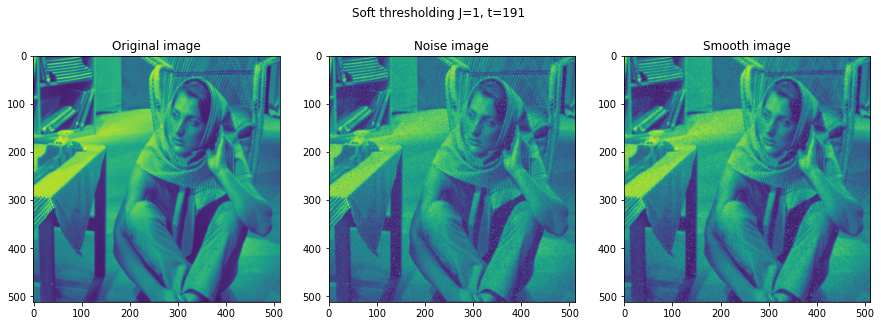

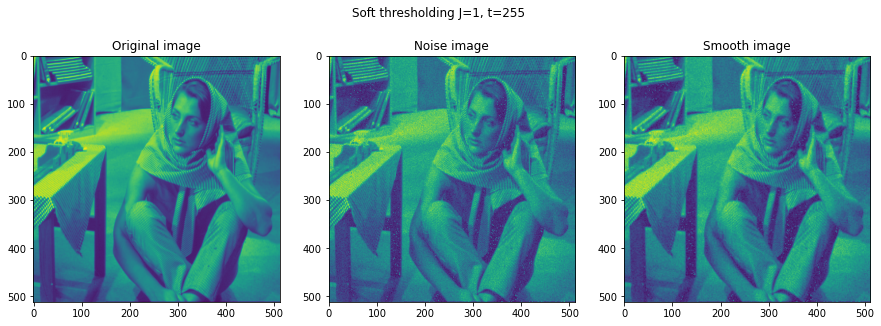

...

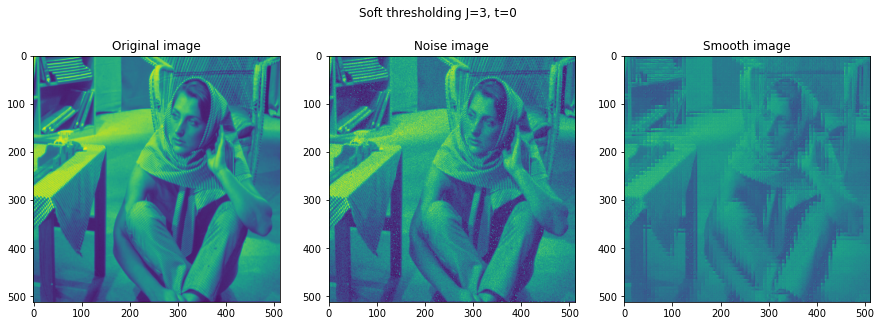

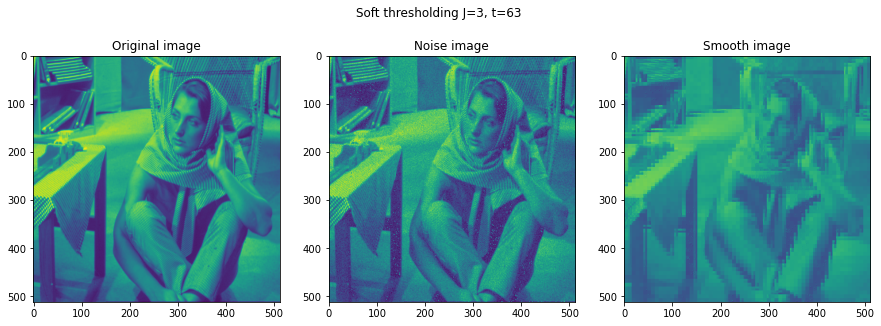

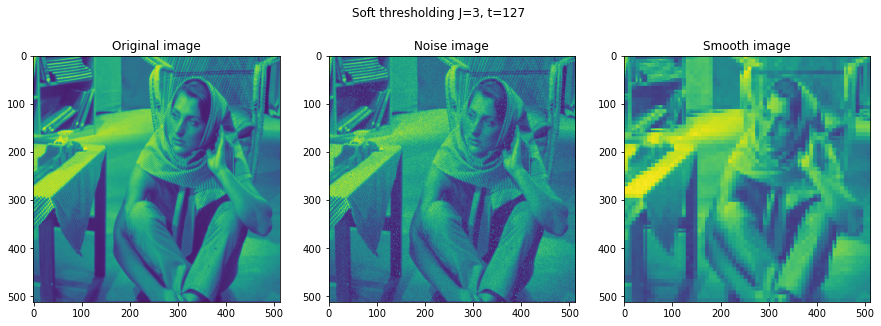

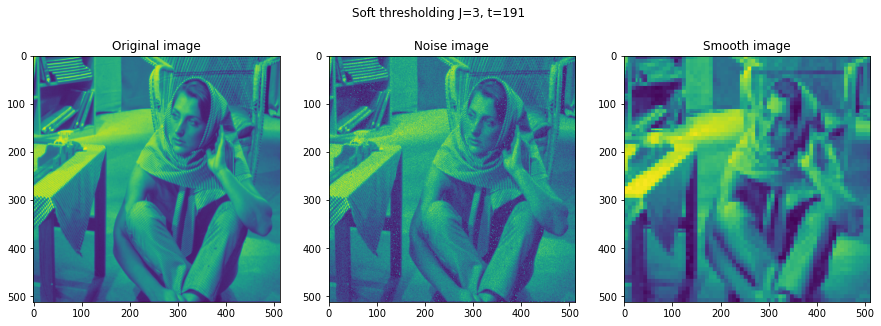

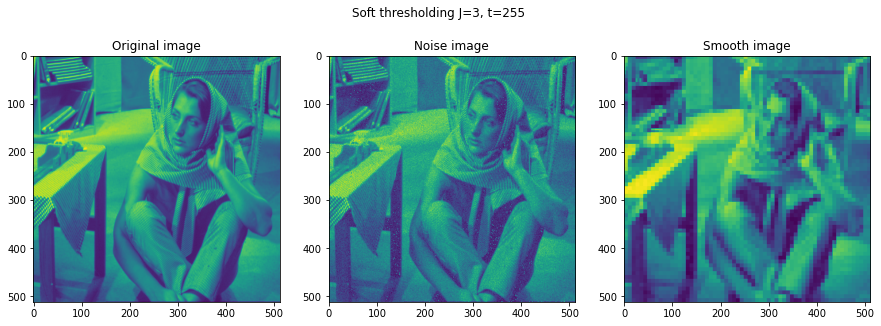

In [36]:
for J in Js:
    for t in ts:
        # apply soft thresholding
        smooth = cvwt.apply_soft_thresholding(noise, J=J, t=t)

        # plots
        fig, axs = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'Soft thresholding: J={J}, t={t}')
        axs[0].imshow(x)
        axs[0].set_title('Original image')

        axs[1].imshow(noise)
        axs[1].set_title('Noise image')

        axs[2].imshow(smooth)
        axs[2].set_title('Smooth image')

#### Questão 4

TODO: use 3 channels instead of only 1 (make operations per channel)

In [37]:
# numbers of iterations
Js = [1, 2, 3]

# parameters for compacting
alphas = [0.1, 0.4, 0.5, 0.7, 0.8, 0.9]

# define input image
x = cv2.imread('cvwt/barbara.jpg')
x = cv2.cvtColor(x, cv2.COLOR_BGR2GRAY)

C:\Users\kirstenl\Anaconda3\envs\mestrado\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  after removing the cwd from sys.path.
C:\Users\kirstenl\Anaconda3\envs\mestrado\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  after removing the cwd from sys.path.


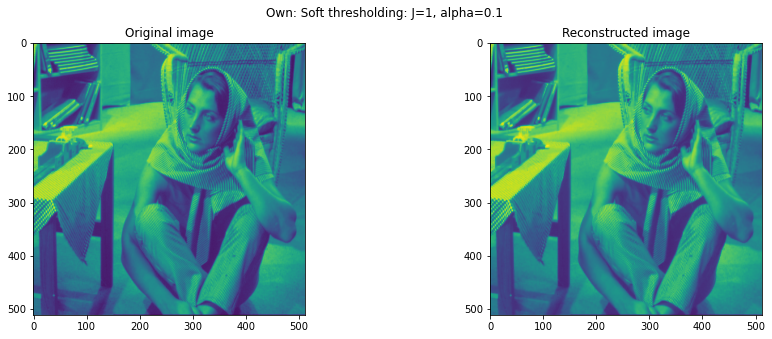

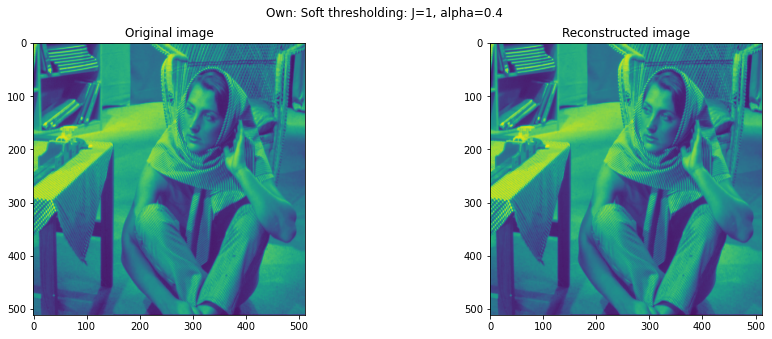

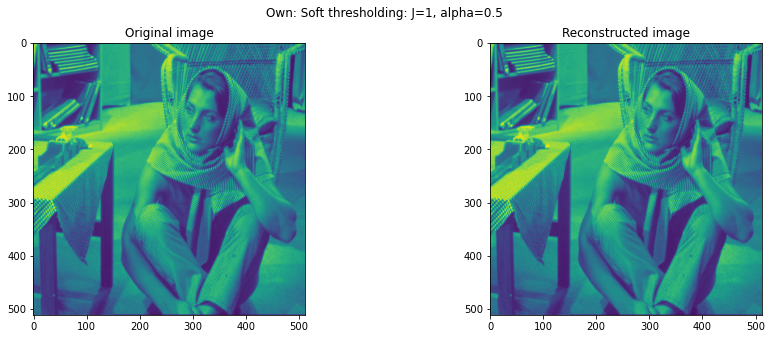

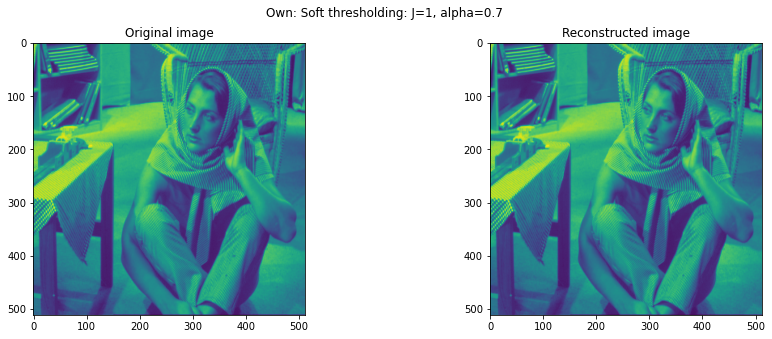

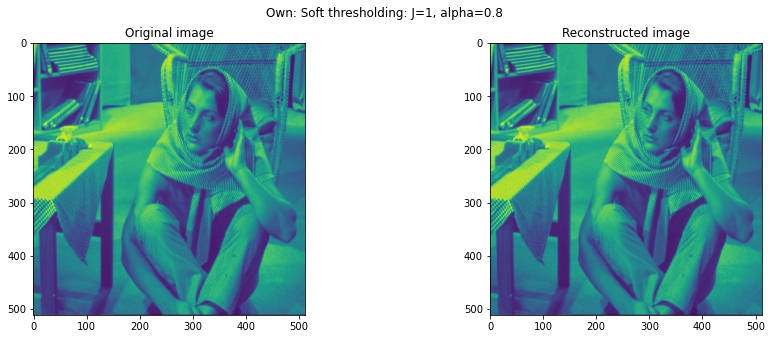

...

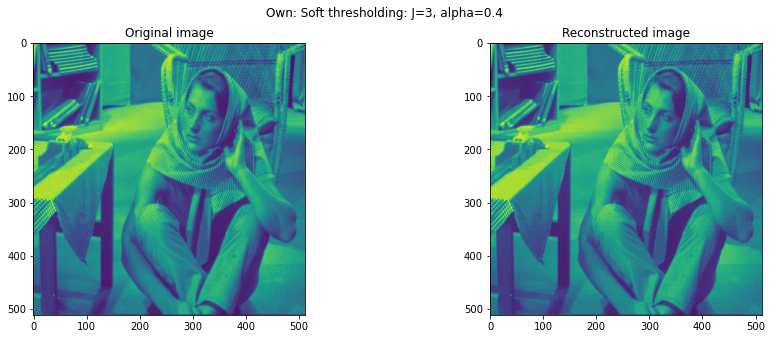

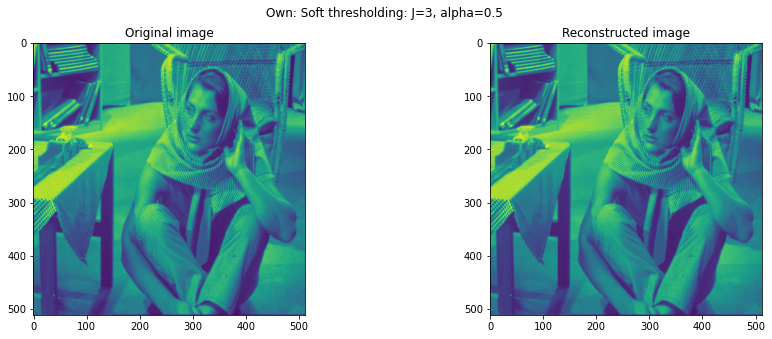

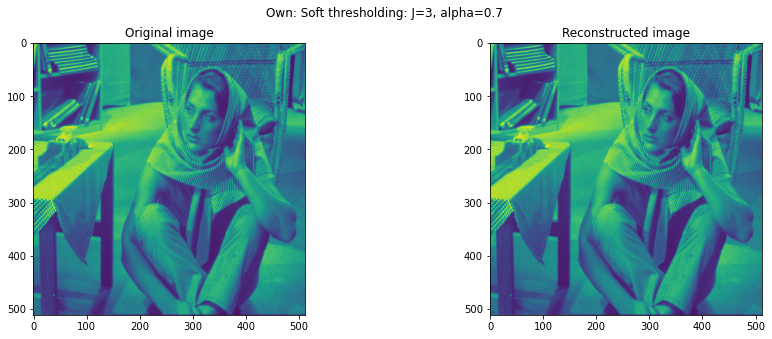

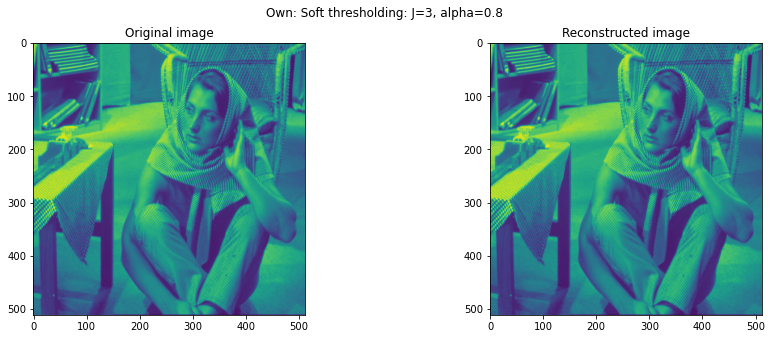

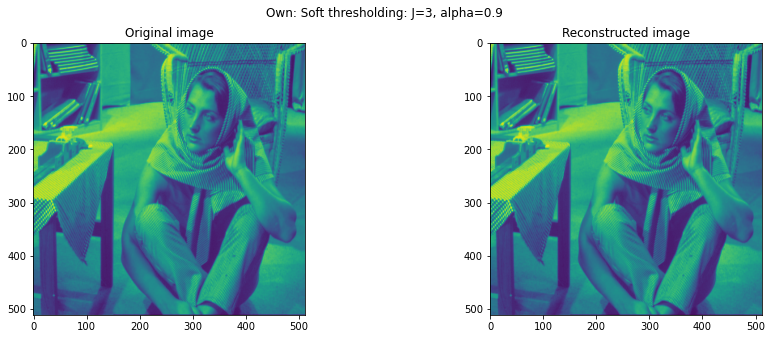

In [39]:
for J in Js:
    for alpha in alphas:
        # compact image
        (cA, Dj, reconstructed) = cvwt.compact_image(x, J=J, alpha=alpha)
    
        fig, axs = plt.subplots(1,2, figsize=(15,5))
        fig.suptitle(f'Own: Soft thresholding: J={J}, alpha={alpha}')
        axs[0].imshow(x)
        axs[0].set_title('Original image')

        axs[1].imshow(reconstructed)
        axs[1].set_title('Reconstructed image')